# Grapes of Math: Nick & Edwige's Formula for Fine Wine

## Project Goals
* Predict the quality of wine while incorporating unsupervised learning techniques.
* Investigate the drivers of quality.
* Explore real world uses for unsupervised clustering models.
* Present our process and findings to the data science team.

## Imports

In [1]:
import explore
import evaluate
import viz
import prepare

seed = 100

## Acquire and Prepare data.

In [2]:
# imports and cleans data
wine = prepare.pour()

### Snapshot of data.

In [3]:
# snapshot
wine.head(2)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,wine_type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red


## Exploration

### What are the differences between red and white wine?

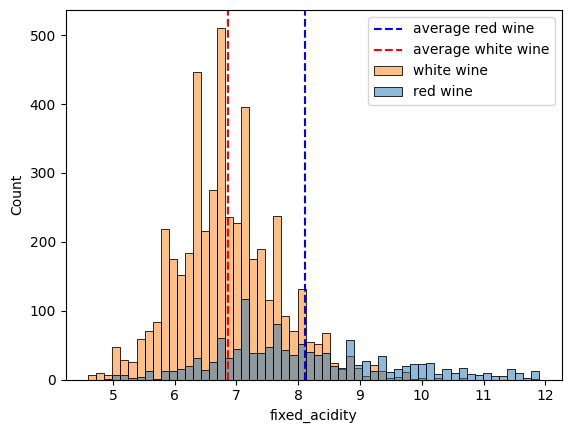

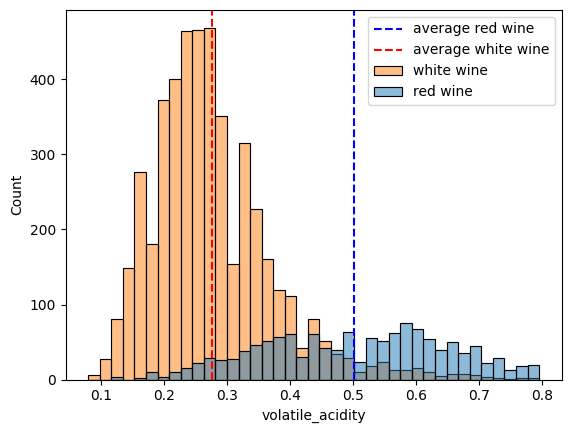

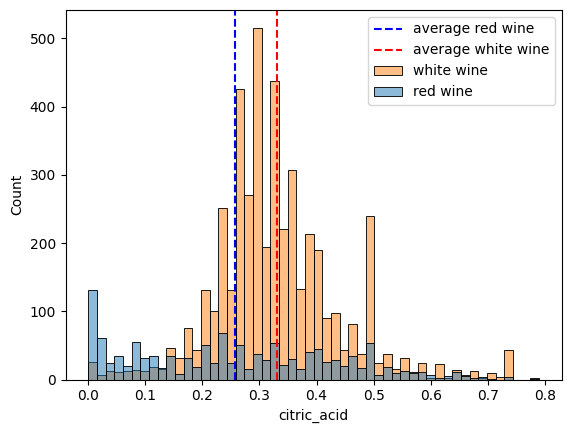

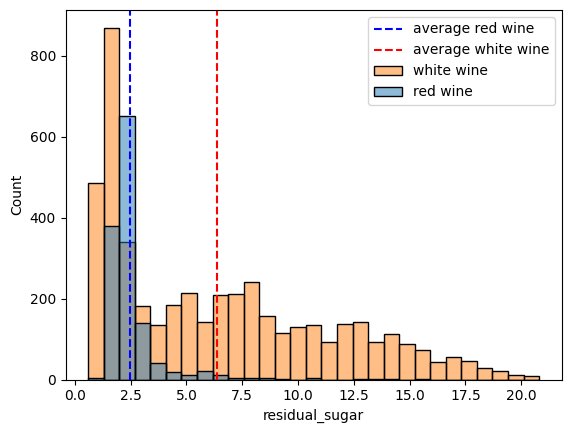

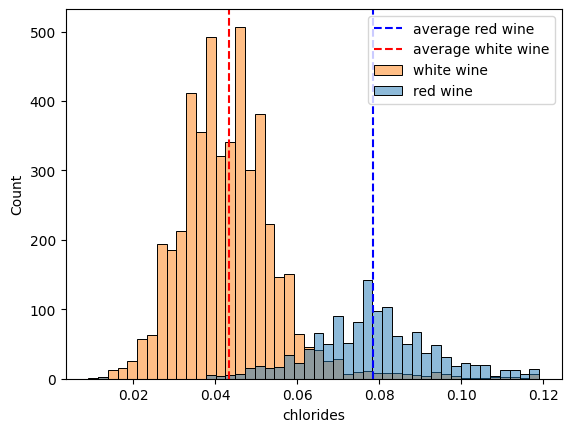

...

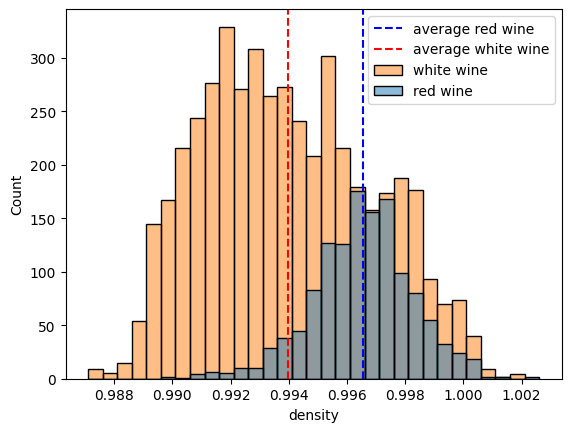

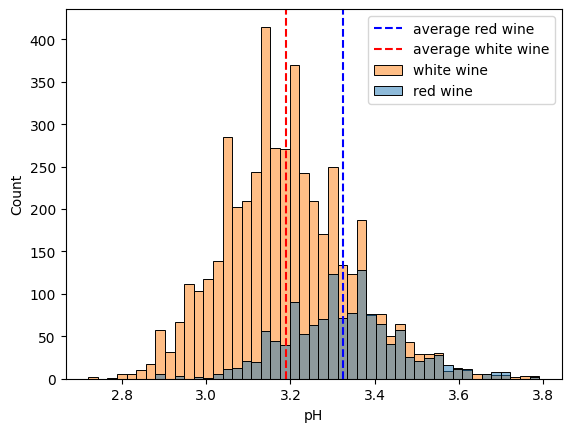

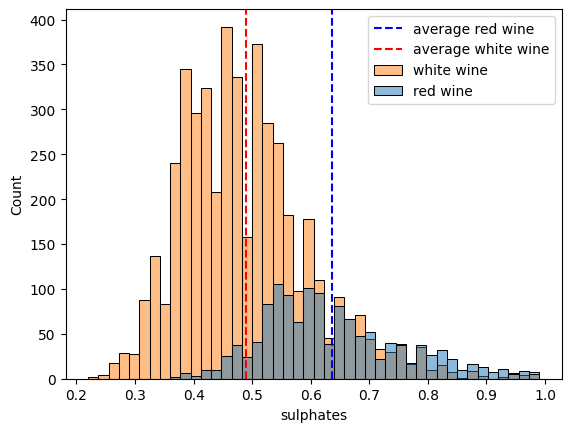

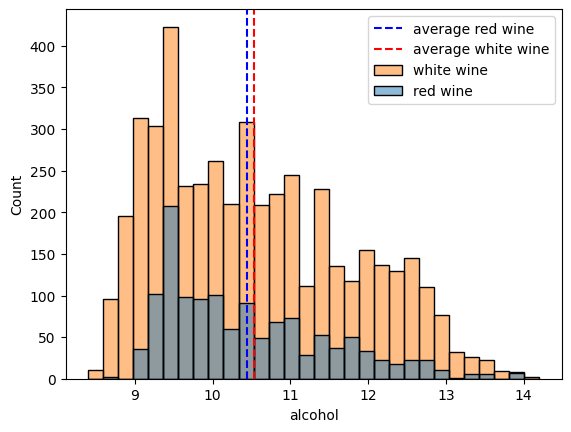

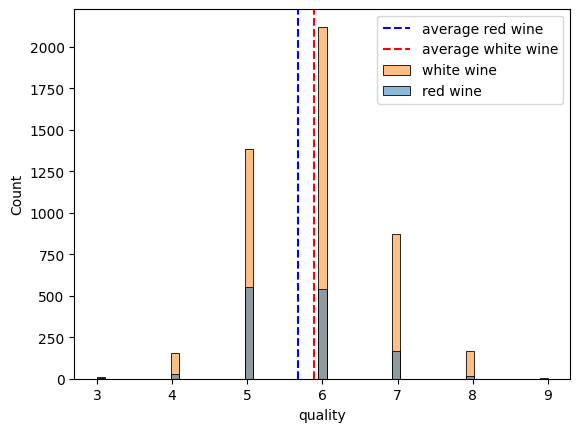

In [4]:
# Explores relationship between red and white wines
explore.red_white(wine)

### Observations from white vs red
* red wine has higher acidic distribution, fixed acidity, and volitale acidity
* red wine has a lower citric acid distribution
* red wine has a higher clorides dirstribuition
* red wine lower in free sulfur dioxide
* red wine lower in toal sulfur dioxide
* red wine is denser than white wine
* red wine has a higher ph than white
* red whine has more sulfates than white

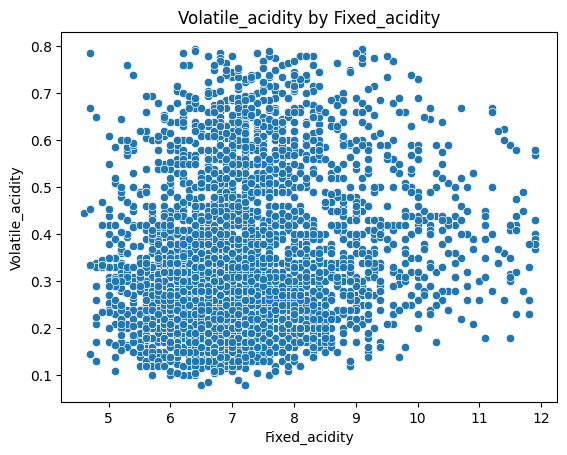

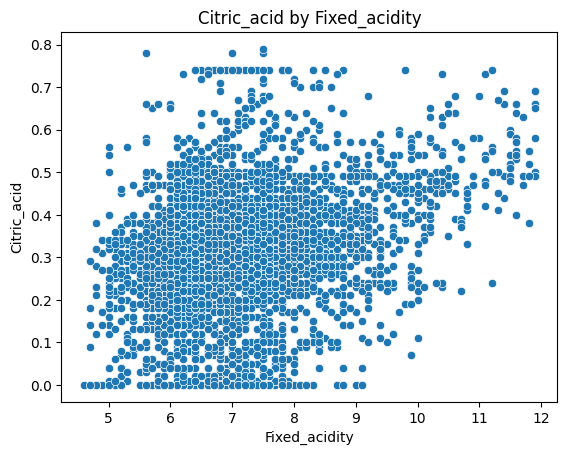

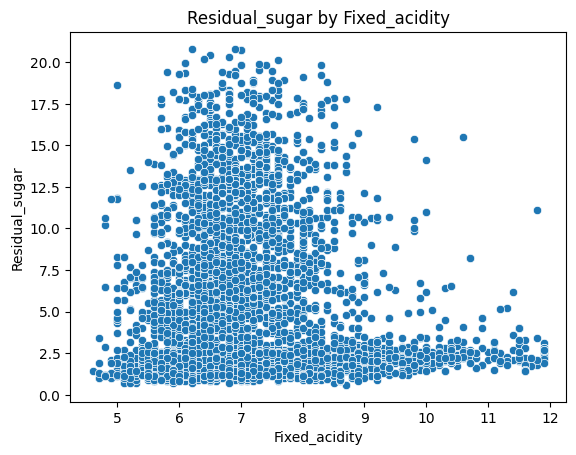

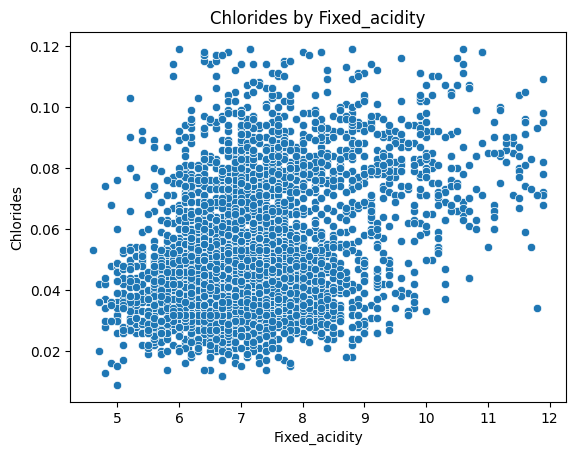

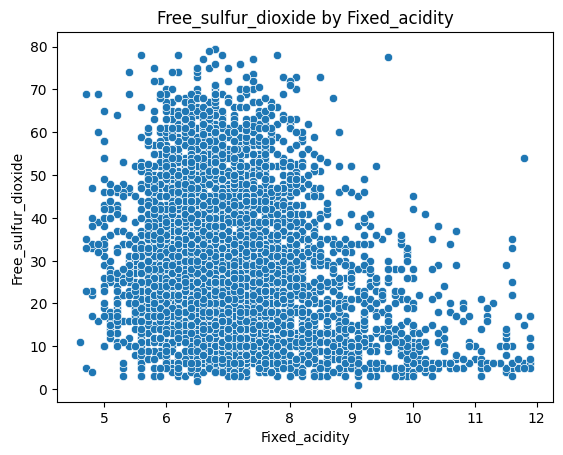

...

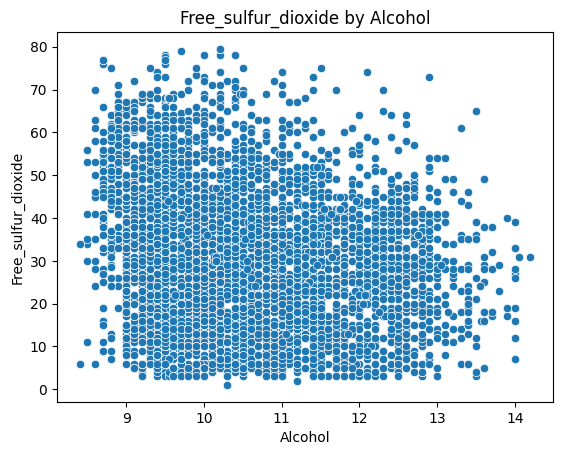

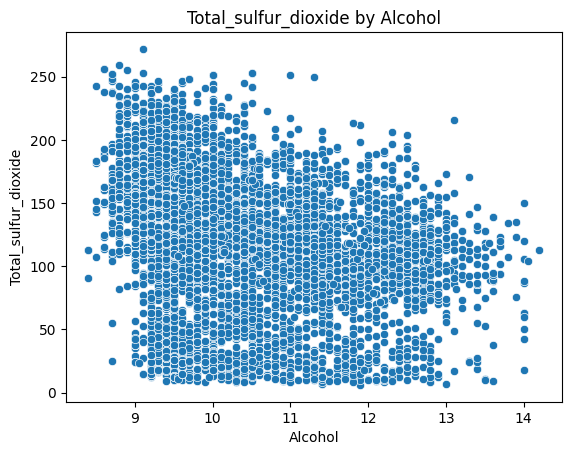

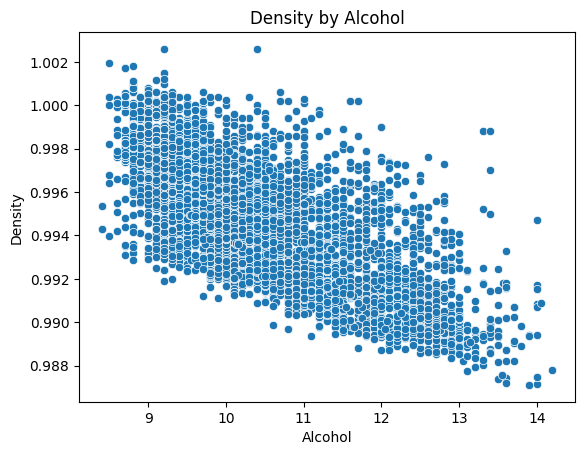

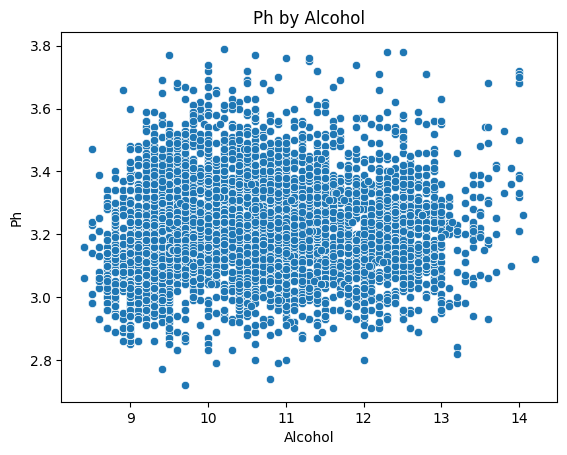

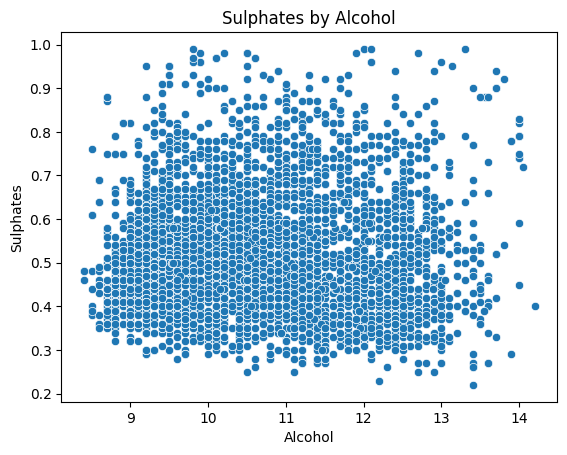

In [5]:
# visualizes all features
viz.cont_plots(wine)

### Observations from quality

* fixed acidity deserves a closer look for stat testing.
* volatile acidity looks like it adversely effects quality.
* citric acid needs stat testing
* chrorides appears to affect quality
* density appears to affect quality
* alchohol strongly effects quality
* quality most direct influencer of quality
* white whines on average of higher wuality

### Obeservations on the relationship between all features?
* total_sulfur_dioxide and chlorides are coorelated in some way.
* density is corelated with many feature.
* it might be worth looking at clusters of related features based on the ingredients or 

### Statistical Tests

Does the feature "fixed_acidity" have an effect on quality?

H_0 fixed_acidity has no effect on quality
H_a fixed_acidity has an effect on quality


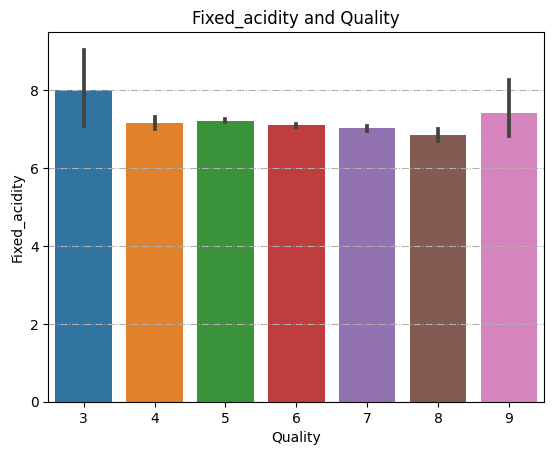

Reject the null hypothesis: fixed_acidity has an effect on quality. (p-value: 4.6613e-12)
-0.08905342212143506


Does the feature "volatile_acidity" have an effect on quality?

H_0 volatile_acidity has no effect on quality
H_a volatile_acidity has an effect on quality


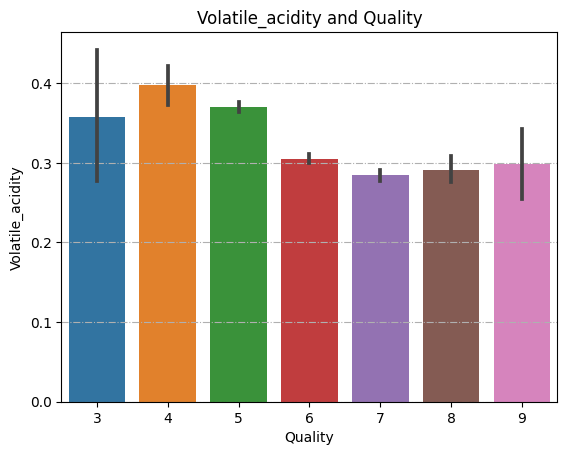

Reject the null hypothesis: volatile_acidity has an effect on quality. (p-value: 4.2686e-74)
-0.23176175431224386


Does the feature "citric_acid" have an effect on quality?

H_0 citric_acid has no effect on quality
H_a citric_acid has an effect on quality


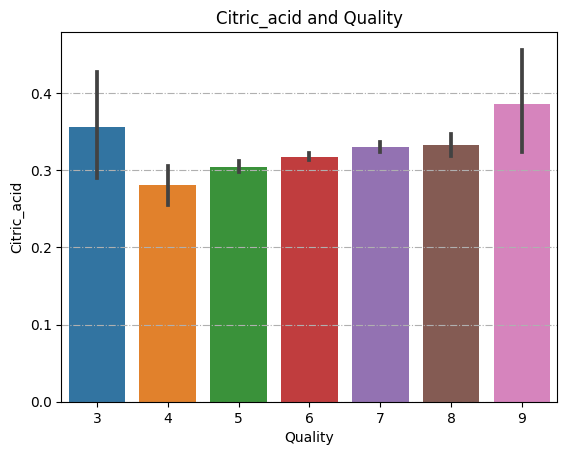

Reject the null hypothesis: citric_acid has an effect on quality. (p-value: 7.3703e-15)
0.10010652622019224


Does the feature "residual_sugar" have an effect on quality?

H_0 residual_sugar has no effect on quality
H_a residual_sugar has an effect on quality


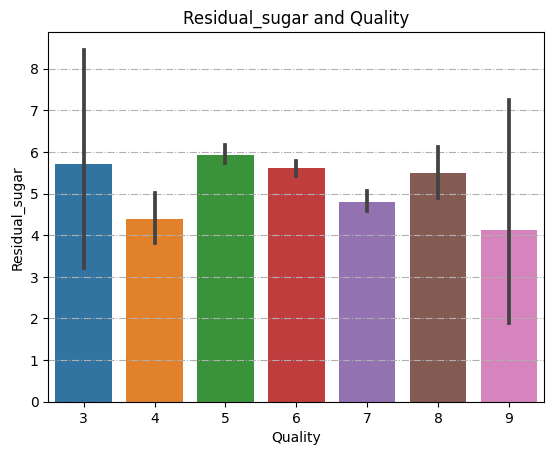

Reject the null hypothesis: residual_sugar has an effect on quality. (p-value: 4.7855e-02)
-0.02552635438564099


Does the feature "chlorides" have an effect on quality?

H_0 chlorides has no effect on quality
H_a chlorides has an effect on quality


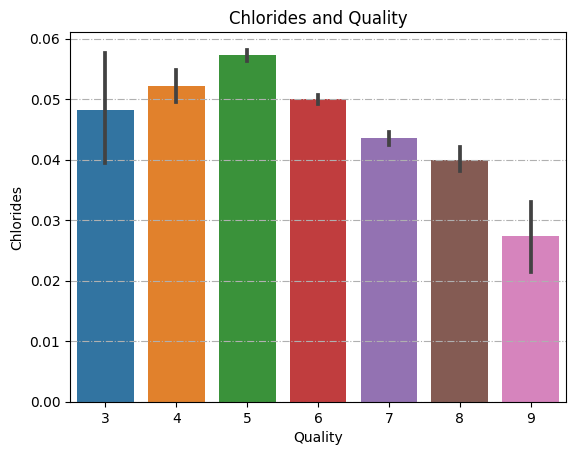

Reject the null hypothesis: chlorides has an effect on quality. (p-value: 5.8128e-115)
-0.2878098394763563


Does the feature "free_sulfur_dioxide" have an effect on quality?

H_0 free_sulfur_dioxide has no effect on quality
H_a free_sulfur_dioxide has an effect on quality


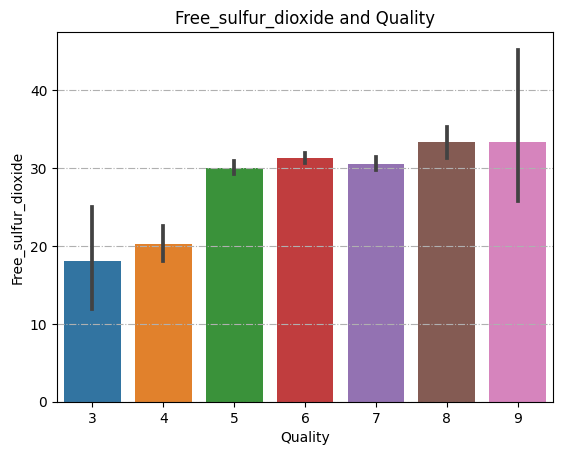

Reject the null hypothesis: free_sulfur_dioxide has an effect on quality. (p-value: 1.3275e-11)
0.08713037277425105


Does the feature "total_sulfur_dioxide" have an effect on quality?

H_0 total_sulfur_dioxide has no effect on quality
H_a total_sulfur_dioxide has an effect on quality


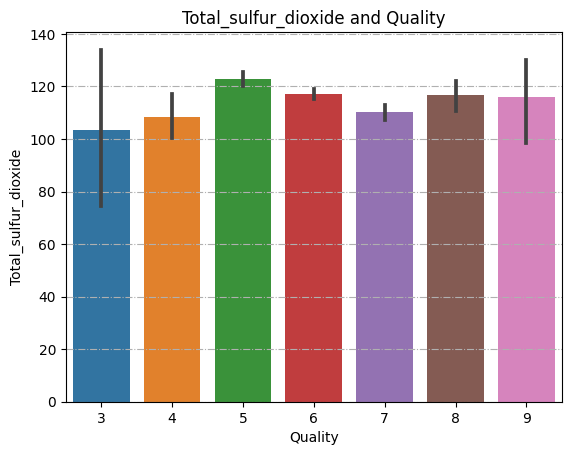

Reject the null hypothesis: total_sulfur_dioxide has an effect on quality. (p-value: 7.1420e-08)
-0.06943157772253626


Does the feature "density" have an effect on quality?

H_0 density has no effect on quality
H_a density has an effect on quality


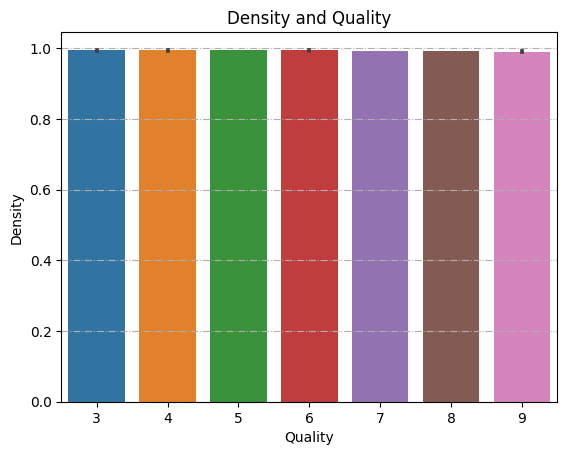

Reject the null hypothesis: density has an effect on quality. (p-value: 3.1503e-148)
-0.32541157337295995


Does the feature "pH" have an effect on quality?

H_0 pH has no effect on quality
H_a pH has an effect on quality


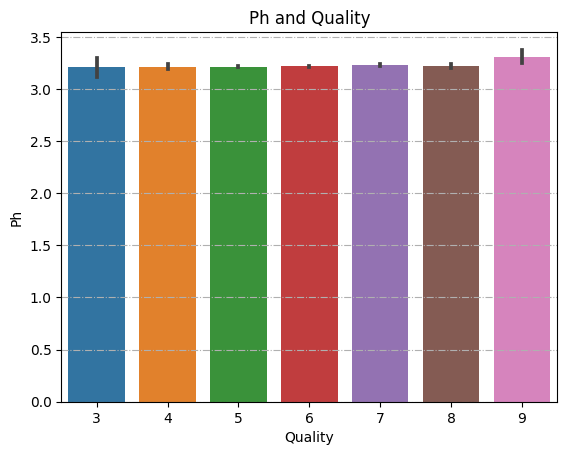

Reject the null hypothesis: pH has an effect on quality. (p-value: 4.4146e-03)
0.03672119281351733


Does the feature "sulphates" have an effect on quality?

H_0 sulphates has no effect on quality
H_a sulphates has an effect on quality


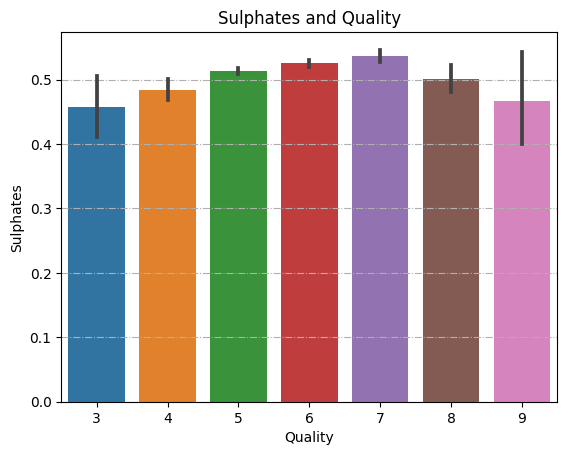

Reject the null hypothesis: sulphates has an effect on quality. (p-value: 5.8860e-03)
0.03552433762706104


Does the feature "alcohol" have an effect on quality?

H_0 alcohol has no effect on quality
H_a alcohol has an effect on quality


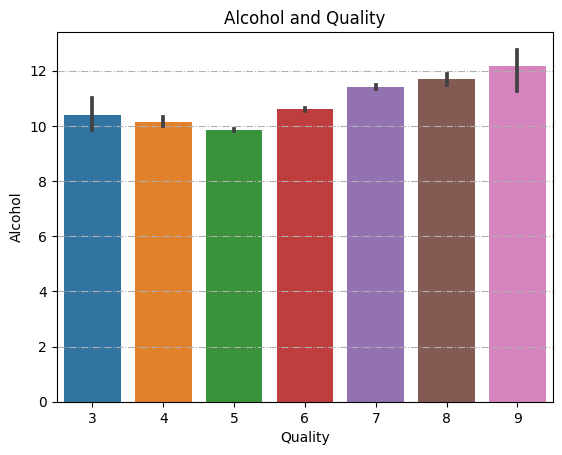

Reject the null hypothesis: alcohol has an effect on quality. (p-value: 9.8233e-302)
0.45284784329575273




In [6]:
# statistical tests on drivers of quality
explore.ttest_viz(wine)

### Obervations from Stats tests for Quality
* Only residual sugar has no statistical effect on quality
* All other features are drivers of quality.
* No one feature seems to have a profound effect on wine quality by itself. It must be a combination of features that determines the quality of a wine.

## Clustering

We tried clustering along many differnt groups. To explore the usefullness of clustering models for feature engineering, model tuning, and exploring the dataset.

* Wine Types: red, white
* Chemical Properties: fixed_acidity, volatile_acidity, citric_acid, chlorides, density, pH, sulphates
* Fermentation Process: free_sulfur_dioxide, total_sulfur_dioxide, residual_sugar

## Predictive Modeling

### Preprocessing split and scale

In [7]:
# splitting dataset
train, val, test = prepare.train_val_test(wine, strat='quality', seed=seed)

In [9]:
# scaling on train
train, val, test = prepare.scale(wine, train=train, val=val, test=test, scaled_cols=(wine.select_dtypes(float).columns))

### Baseline model evlauation

In [10]:
# determines best metric to be used for baseline
results = evaluate.baseline(train.quality)

In [11]:
# evaluation of best baseline metric
SSE, MSE, RMSE = evaluate.eval_model(results.quality, results.base_mean)
SSE, MSE, RMSE

(3072.132429862102, 0.7304166499909895, 0.8546441657151762)

### Baseline model result.
* THE BEST BASELINE MODEL HAD AN RMSE OF .855.

In [ ]:
### Models

In [ ]:
### Best model result

In [ ]:
## Result on train data

## Conclusion

* Clustering did not meaningfully impact our models as we used it. If we leaned into red versus white then we could perhaps increase our model accuracy.

* Our model was able to beat the baseline model by:

### Next Steps
* Explore Davies-Bouldin Index, & Calinski-Harabasz Index for determining minimum number of ideal clusters for the different clustering models. This will allow a progromatic assessment of clustering.
* Explore silhouette scoreing as means to determine quality of clustering.
* Cluster all variables by white and red. The clusters that we did do show that a lot of the data is representented in that catagory. Clustering might allow us to greatly reduce noise using those two obvious splits.
* Create two seperate models for red and white respectively.